# **Machine Learning - CNN** # 



# Preparation


In [ ]:
import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Import Dataset

In [ ]:
import cv2
import os 
import numpy as np

# extract zip file
from zipfile import ZipFile
with ZipFile('/content/drive/MyDrive/Colab Notebooks/ML Coursework/COP508_Sea_Animal_dataset.zip', 'r') as zipObj:
  zipObj.extractall('/content/')

sea_animals = '/content/COP508_Sea_Animal_dataset'

class_names = ['Corals', 'Crabs', 'Dolphin', 'Eel', 'Jelly Fish', 'Lobster', 'Nudibranchs',
              'Octopus', 'Puffers', 'Sea Rays', 'Seahorse', 'Seal', 'Sharks', 'Squid', 'Starfish',
               'Whale']
X = []
y = []

# iterarate through dataset
for names_index, names in enumerate(class_names):
  for images in os.listdir(os.path.join(sea_animals, names)):
    image_path = os.path.join(sea_animals, names, images)
    # read images and save into list
    img = cv2.imread(image_path)
    # resize images so all equal
    img = cv2.resize(img, (80, 80))
    X.append(img) 
    y.append(names_index)

# X contains images
X = np.asarray(X)
# y contains labels
y = np.asarray(y)


Exploring Dataset

This training set contains 16 classes, as listed below

In [ ]:
os.listdir(sea_animals)

['Seahorse',
 'Starfish',
 'Jelly Fish',
 'Seal',
 'Lobster',
 'Sea Rays',
 'Puffers',
 'Squid',
 'Whale',
 'Corals',
 'Nudibranchs',
 'Sharks',
 'Crabs',
 'Octopus',
 'Eel',
 'Dolphin']

These are the names of all images within the, 'Eel,' class

In [ ]:
os.listdir(os.path.join(sea_animals, 'Eel'))

['32102807772_c5a92a0d5b_b.jpg',
 '15815461754_e0478e56be_o.jpg',
 '233118790_49a34c3ce0_o.jpg',
 '14118782981_6330f43049_b.jpg',
 '3605359334_d3e8b3943d_b.jpg',
 '4155234224_2c5530c11e_o.jpg',
 '3832169097_dd24bb1e14_o.jpg',
 '7776217078_7eaefc1a0c_b.jpg',
 '8155197556_ed7840a037_o.jpg',
 '7946873882_3348b90680_o.jpg',
 '5169235140_5f112dcdff_o.jpg',
 '2798479217_7a0cabfd94_b.jpg',
 '11560314403_c623953e68_o.jpg',
 '43266545031_68db35808e_b.jpg',
 '9971081013_a7e1f041da_o.jpg',
 '4244783227_715250a24d_o.jpg',
 '6245807589_7d863d80dd_o.jpg',
 '5322296456_8b2b566fc1_o.jpg',
 '13170307045_a6c776c632_o.jpg',
 '1354021192_c759d528ef_o.jpg',
 '33122782253_c7f70954cb_b.jpg',
 '15095858658_4344a7fe11_b.jpg',
 '33629151704_a0c90aa4a7_b.jpg',
 '266694447_b7b1ecdffb_o.jpg',
 '14463974261_c74ede430c_o.jpg',
 '8173854608_f36d5fdec3_o.jpg',
 '21458573411_35dc264bcf_b.jpg',
 '2431678639_60c20b7de7_o.jpg',
 '5602738024_813b2dde37_b.jpg',
 '29625028414_19b08ae1f9_b.jpg',
 '26633590373_97c8db26ab_o.jpg

Classes, with amount of images within each class

In [ ]:
sea_animals_data = {}
sea_animals_classes = sorted(os.listdir(sea_animals))
for name in sea_animals_classes:
    sea_animals_data[name] = len(os.listdir(sea_animals + f'/{name}'))
print(sea_animals_data)

{'Corals': 500, 'Crabs': 499, 'Dolphin': 782, 'Eel': 497, 'Jelly Fish': 855, 'Lobster': 499, 'Nudibranchs': 500, 'Octopus': 562, 'Puffers': 531, 'Sea Rays': 517, 'Seahorse': 478, 'Seal': 414, 'Sharks': 590, 'Squid': 483, 'Starfish': 499, 'Whale': 572}


X contains 8778 images, with image size of 80x80 pixels, and 3 channels

y contains 8778 labels relevant to the images

In [ ]:
print(X.shape)
print(y.shape)

(8778, 80, 80, 3)
(8778,)


Dataset is divided into a 70/20 training, testing split

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True, stratify=y)

X_train contains 7022 images, with image size of 80x80 pixels, and 3 channels

X_test contains 1756 images, with image size of 80x80 pixels, and 3 channels

In [ ]:
print(X_train.shape)
print(X_test.shape)

(7022, 80, 80, 3)
(1756, 80, 80, 3)


In [ ]:
print('X_train:', X_train)
print('X_test', X_test)

X_train: [[[[171 113   1]
   [169 118   4]
   [171 106   0]
   ...
   [205 176 101]
   [206 177 101]
   [207 177 100]]

  [[160 118  22]
   [177 120   5]
   [167 118   7]
   ...
   [204 178 106]
   [199 174 101]
   [205 179 105]]

  [[238 209 152]
   [152 102   0]
   [200 161  82]
   ...
   [205 174  93]
   [201 170  89]
   [207 175  96]]

  ...

  [[173 116   0]
   [173 117   0]
   [174 117   1]
   ...
   [154 105   6]
   [163 110   3]
   [174 117   3]]

  [[175 119   0]
   [176 120   1]
   [176 120   1]
   ...
   [173 115   6]
   [177 119   4]
   [181 121   1]]

  [[176 121   0]
   [177 122   1]
   [177 122   1]
   ...
   [182 119   1]
   [183 122   2]
   [182 121   0]]]


 [[[165 144 122]
   [168 147 125]
   [156 135 113]
   ...
   [140 113  86]
   [138 111  84]
   [136 109  82]]

  [[134 113  91]
   [114  93  71]
   [118  97  75]
   ...
   [138 111  84]
   [140 113  86]
   [135 108  81]]

  [[143 122 100]
   [129 108  86]
   [134 113  91]
   ...
   [137 110  83]
   [135 108  81]
  

Labels 

In [ ]:
print('Labels in y:', np.bincount(y))
print('Labels in y_train:', np.bincount(y_train))
print('Labels in y_test:', np.bincount(y_test))
print('y_train:', y_train)
print('y_test', y_test)

Labels in y: [500 499 782 497 855 499 500 562 531 517 478 414 590 483 499 572]
Labels in y_train: [400 399 625 398 684 399 400 450 425 414 382 331 472 386 399 458]
Labels in y_test: [100 100 157  99 171 100 100 112 106 103  96  83 118  97 100 114]
y_train: [ 2 15  9 ...  5  5  3]
y_test [14  4 11 ...  1  3 12]


Plotting an image from dataset

(-0.5, 79.5, 79.5, -0.5)

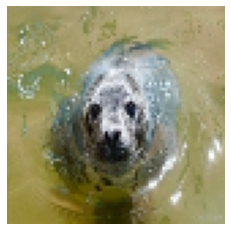

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(X_train.reshape(7022, 80, 80, 3)[5])
plt.axis('off')

Third image in the training set is a Starfish

In [ ]:
class_names[y_test[3]]

'Starfish'

Plotting the first 20 images from the training set

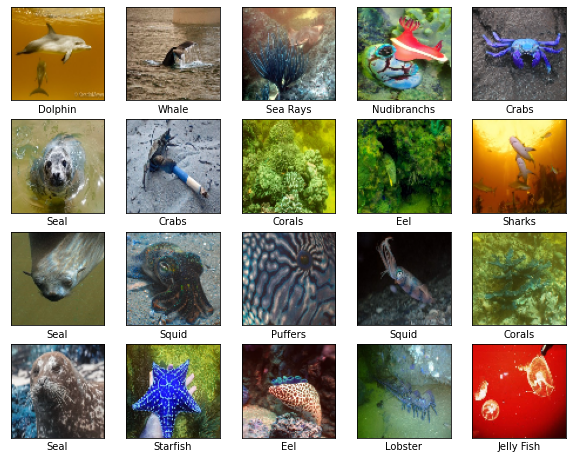

In [ ]:
plt.figure(figsize=(10, 10))
for i in range(20):
  plt.subplot(5, 5, i + 1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(X_train.reshape(7022, 80, 80, 3)[i], cmap='binary')
  plt.xlabel(class_names[y_train[i]])
plt.show()

X_train before standardisation

In [ ]:
X_train

array([[[[171, 113,   1],
         [169, 118,   4],
         [171, 106,   0],
         ...,
         [205, 176, 101],
         [206, 177, 101],
         [207, 177, 100]],

        [[160, 118,  22],
         [177, 120,   5],
         [167, 118,   7],
         ...,
         [204, 178, 106],
         [199, 174, 101],
         [205, 179, 105]],

        [[238, 209, 152],
         [152, 102,   0],
         [200, 161,  82],
         ...,
         [205, 174,  93],
         [201, 170,  89],
         [207, 175,  96]],

        ...,

        [[173, 116,   0],
         [173, 117,   0],
         [174, 117,   1],
         ...,
         [154, 105,   6],
         [163, 110,   3],
         [174, 117,   3]],

        [[175, 119,   0],
         [176, 120,   1],
         [176, 120,   1],
         ...,
         [173, 115,   6],
         [177, 119,   4],
         [181, 121,   1]],

        [[176, 121,   0],
         [177, 122,   1],
         [177, 122,   1],
         ...,
         [182, 119,   1],
        

Standardisation

In [ ]:
X_mean = X_train.mean(axis=0, keepdims=True)
X_std = X_train.std(axis=0, keepdims=True) + 1e-7
X_train = (X_train - X_mean) / X_std
X_test = (X_test - X_mean) / X_std
#X_val = (X_val - X_mean) / X_std

X_train after standardisation

In [ ]:
X_train

array([[[[ 8.84793425e-01,  3.31359155e-01, -9.17064972e-01],
         [ 8.28209651e-01,  3.86364992e-01, -8.76457354e-01],
         [ 8.38964728e-01,  1.85244818e-01, -9.38171264e-01],
         ...,
         [ 1.29979034e+00,  1.27138395e+00,  6.49207284e-01],
         [ 1.33081031e+00,  1.30399308e+00,  6.56881434e-01],
         [ 1.36441521e+00,  1.32050500e+00,  6.46430969e-01]],

        [[ 7.26667154e-01,  4.03409890e-01, -5.89304628e-01],
         [ 9.36029225e-01,  4.11372755e-01, -8.64701188e-01],
         [ 7.79782596e-01,  3.61364454e-01, -8.34737144e-01],
         ...,
         [ 1.28949900e+00,  1.30559472e+00,  7.27896045e-01],
         [ 1.23174458e+00,  1.25074498e+00,  6.51572036e-01],
         [ 1.33120612e+00,  1.34619341e+00,  7.20694648e-01]],

        [[ 1.79229667e+00,  1.80585344e+00,  1.45900384e+00],
         [ 5.91983361e-01,  1.30356176e-01, -9.44647111e-01],
         [ 1.23086089e+00,  1.02319411e+00,  3.28884958e-01],
         ...,
         [ 1.30113012e+0

Plotting images after standardisation

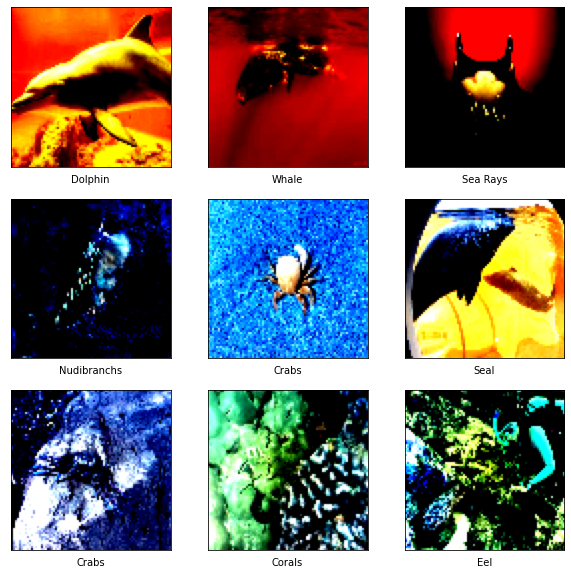

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
for i in range(9):
  plt.subplot(3, 3, i + 1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(X_train.reshape(7022, 80, 80, 3)[i], cmap='binary')
  plt.xlabel(class_names[y_train[i]])
plt.show()

Further splitting into additional validation set

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1, shuffle=True)

Labels

In [ ]:
print('Labels in y:', np.bincount(y))
print('Labels in y_train:', np.bincount(y_train))
print('Labels in y_test:', np.bincount(y_test))
print('Labels in y_val:', np.bincount(y_val))
print('y_train:', y_train)
print('y_test', y_test)
print('y_val', y_val)

Labels in y: [500 499 782 497 855 499 500 562 531 517 478 414 590 483 499 572]
Labels in y_train: [294 294 460 302 509 298 297 333 307 326 292 244 378 289 304 339]
Labels in y_test: [100 100 157  99 171 100 100 112 106 103  96  83 118  97 100 114]
Labels in y_val: [106 105 165  96 175 101 103 117 118  88  90  87  94  97  95 119]
y_train: [ 0 14  8 ...  4 12 13]
y_test [14  4 11 ...  1  3 12]
y_val [ 8  4 12 ...  2  9  1]


One Hot Encoding

In [ ]:
from keras.utils import to_categorical
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)
y_val = to_categorical(y_val)

# CNN

Original dtype

In [ ]:
X_train.dtype

dtype('float64')

Changing dtype to float32

In [ ]:
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

Modified dtype

In [ ]:
X_train.dtype

dtype('float32')

CNN Architecture

In [ ]:
import tensorflow as tf
from tensorflow import keras

model = keras.models.Sequential([
    keras.layers.Conv2D(filters=64, kernel_size=6, activation='relu', padding='same', input_shape=[80, 80, 3]),
    keras.layers.MaxPooling2D(pool_size=2),

    keras.layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding='same'),
    keras.layers.MaxPooling2D(pool_size=2),

    keras.layers.Conv2D(filters=256, kernel_size=3, activation='relu', padding='same'),
    keras.layers.MaxPooling2D(pool_size=2),

    keras.layers.Conv2D(filters=256, kernel_size=3, activation='relu', padding='same'),
    keras.layers.MaxPooling2D(pool_size=2),
    keras.layers.Dropout(0.4),
    
    keras.layers.Flatten(),
    keras.layers.Dense(units=40, activation='relu'),
    keras.layers.Dropout(0.4),
    keras.layers.Dense(units=16, activation='softmax'),

])

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 80, 80, 64)        6976      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 40, 40, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 40, 40, 128)       73856     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 20, 20, 128)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 20, 20, 256)       295168    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 10, 10, 256)     

In [ ]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history_cnn = model.fit(X_train, y_train, epochs=30, validation_data=(X_val, y_val))

Epoch 1/30
165/165 [==============================] - 11s 27ms/step - loss: 2.6065 - accuracy: 0.1489 - val_loss: 2.4445 - val_accuracy: 0.1959
Epoch 2/30
165/165 [==============================] - 4s 24ms/step - loss: 2.4535 - accuracy: 0.1745 - val_loss: 2.3314 - val_accuracy: 0.2130
Epoch 3/30
165/165 [==============================] - 4s 23ms/step - loss: 2.3797 - accuracy: 0.1954 - val_loss: 2.3286 - val_accuracy: 0.2170
Epoch 4/30
165/165 [==============================] - 4s 24ms/step - loss: 2.3301 - accuracy: 0.2144 - val_loss: 2.2686 - val_accuracy: 0.2591
Epoch 5/30
165/165 [==============================] - 4s 23ms/step - loss: 2.2911 - accuracy: 0.2233 - val_loss: 2.1616 - val_accuracy: 0.2916
Epoch 6/30
165/165 [==============================] - 4s 26ms/step - loss: 2.2392 - accuracy: 0.2457 - val_loss: 2.1607 - val_accuracy: 0.2899
Epoch 7/30
165/165 [==============================] - 4s 23ms/step - loss: 2.2145 - accuracy: 0.2547 - val_loss: 2.1550 - val_accuracy: 0.303

CNN Evaluation

In [ ]:
model_eval = model.evaluate(X_test, y_test)

55/55 [==============================] - 1s 9ms/step - loss: 2.1125 - accuracy: 0.3593


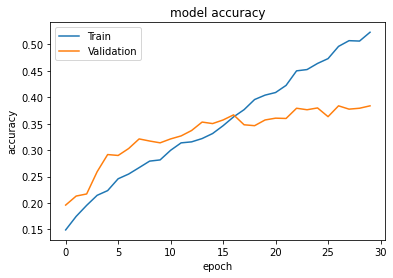

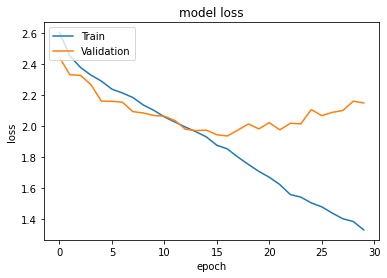

In [ ]:
import matplotlib.pyplot as plt

# summarize history for accuracy
plt.plot(history_cnn.history['accuracy'])
plt.plot(history_cnn.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history_cnn.history['loss'])
plt.plot(history_cnn.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

Predicting image class using CNN

Corals (class 1)

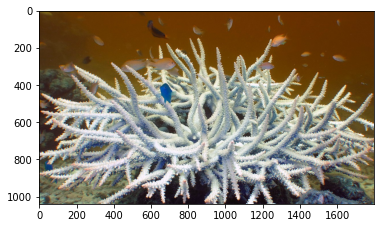

In [ ]:
import matplotlib.pyplot as plt 
corals = cv2.imread('corals_test.jpg')
plt.imshow(corals)

In [ ]:
from keras.preprocessing import image
import keras.utils as image
img_corals_name = 'corals_test.jpg'
path = '/content/corals_test.jpg'
img_corals = image.load_img(path, target_size=(80, 80))
x=image.img_to_array(img_corals)
x=np.expand_dims(x, axis=0)
imgs = np.vstack([x])

classes = model.predict(imgs, batch_size=8)
print(classes)

1/1 [==============================] - 0s 196ms/step
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 9.9997234e-01 0.0000000e+00
  1.9831103e-19 2.5935364e-05 3.1547517e-22 2.6467401e-11 0.0000000e+00
  1.6119297e-06 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00]]


Lobster (class 6)

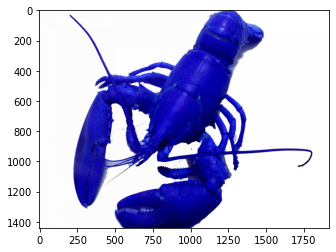

In [ ]:
lobster = cv2.imread('lobster_test.jpg')
plt.imshow(lobster)

In [ ]:
img_lobster_name = 'lobster_test.jpg'
path = '/content/lobster_test.jpg'
img_lobster = image.load_img(path, target_size=(80, 80))

x=image.img_to_array(img_lobster)
x=np.expand_dims(x, axis=0)
imgs = np.vstack([x])

classes = model.predict(imgs, batch_size=8)
print(classes)

1/1 [==============================] - 0s 18ms/step
[[0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 1.983623e-15
  0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
  1.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
  0.000000e+00]]


# CNN 2

CNN 2 Architecture

In [ ]:
model_2 = keras.models.Sequential([
    keras.layers.Conv2D(filters=64, kernel_size=2, activation='relu', padding='same', input_shape=[80, 80, 3]),
    keras.layers.MaxPooling2D(pool_size=2),

    keras.layers.Conv2D(filters=100, kernel_size=1, activation='relu', padding='same'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(pool_size=2),

    keras.layers.Conv2D(filters=200, kernel_size=1, activation='relu', padding='same'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(pool_size=2),

    keras.layers.Conv2D(filters=200, kernel_size=1, activation='relu', padding='same'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(pool_size=2),
   
    keras.layers.Flatten(),
    keras.layers.Dense(units=40, activation='relu'),
    keras.layers.Dropout(0.4),
    keras.layers.Dense(units=16, activation='softmax'),
])

In [ ]:
model_2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 80, 80, 64)        832       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 40, 40, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 40, 40, 100)       6500      
                                                                 
 batch_normalization (BatchN  (None, 40, 40, 100)      400       
 ormalization)                                                   
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 20, 20, 100)      0         
 2D)                                                             
                                                        

In [ ]:
import tensorflow as tf
optimizer = tf.keras.optimizers.Adam(0.01)
optimizer.learning_rate.assign(0.0005)
model_2.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
history_cnn_2 = model_2.fit(X_train, y_train, epochs=20, validation_data=(X_val, y_val))

Epoch 1/20
165/165 [==============================] - 6s 18ms/step - loss: 2.7076 - accuracy: 0.1538 - val_loss: 5.1294 - val_accuracy: 0.0695
Epoch 2/20
165/165 [==============================] - 3s 17ms/step - loss: 2.5026 - accuracy: 0.2017 - val_loss: 3.1113 - val_accuracy: 0.1885
Epoch 3/20
165/165 [==============================] - 3s 19ms/step - loss: 2.4234 - accuracy: 0.2281 - val_loss: 2.3105 - val_accuracy: 0.2813
Epoch 4/20
165/165 [==============================] - 3s 20ms/step - loss: 2.3402 - accuracy: 0.2453 - val_loss: 2.2331 - val_accuracy: 0.3018
Epoch 5/20
165/165 [==============================] - 3s 21ms/step - loss: 2.2347 - accuracy: 0.2670 - val_loss: 2.1692 - val_accuracy: 0.3178
Epoch 6/20
165/165 [==============================] - 4s 22ms/step - loss: 2.1754 - accuracy: 0.2826 - val_loss: 2.1551 - val_accuracy: 0.3149
Epoch 7/20
165/165 [==============================] - 3s 17ms/step - loss: 2.1059 - accuracy: 0.3067 - val_loss: 2.1423 - val_accuracy: 0.3343

CNN Model 2 evaluation

In [ ]:
model_2_eval = model_2.evaluate(X_test, y_test)

55/55 [==============================] - 0s 6ms/step - loss: 1.9763 - accuracy: 0.3724


In [ ]:
loss, accuracy = model_2.evaluate(X_test, y_test, verbose=1)
loss_v, accuracy_v = model_2.evaluate(X_val, y_val, verbose=1)
print("Validation: accuracy = %f  ;  loss_v = %f" % (accuracy_v, loss_v))
print("Test: accuracy = %f  ;  loss = %f" % (accuracy, loss))


55/55 [==============================] - 0s 6ms/step - loss: 2.0018 - accuracy: 0.3582
Validation: accuracy = 0.358200  ;  loss_v = 2.001807
Test: accuracy = 0.372437  ;  loss = 1.976254


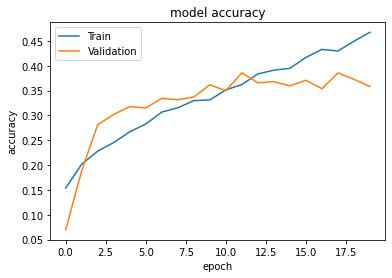

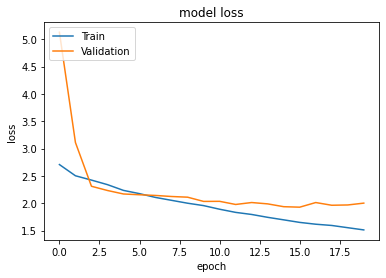

In [ ]:
# accuracy
plt.plot(history_cnn_2.history['accuracy'])
plt.plot(history_cnn_2.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
# loss
plt.plot(history_cnn_2.history['loss'])
plt.plot(history_cnn_2.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

Predicting image class using cnn

Corals (class 1)

In [ ]:
img_corals_name = 'corals_test.jpg'
path = '/content/corals_test.jpg'
img_corals = image.load_img(path, target_size=(80, 80))
x=image.img_to_array(img_corals)
x=np.expand_dims(x, axis=0)
imgs = np.vstack([x])

classes = model_2.predict(imgs, batch_size=8)
print(classes)

1/1 [==============================] - 0s 311ms/step
[[3.7568671e-07 0.0000000e+00 0.0000000e+00 2.0598838e-35 0.0000000e+00
  0.0000000e+00 0.0000000e+00 0.0000000e+00 4.4483184e-31 0.0000000e+00
  9.9999964e-01 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00]]


Lobster (class 6)

In [ ]:
img_lobster_name = 'lobster_test.jpg'
path = '/content/lobster_test.jpg'
img_lobster = image.load_img(path, target_size=(80, 80))

x=image.img_to_array(img_lobster)
x=np.expand_dims(x, axis=0)
imgs = np.vstack([x])

classes = model_2.predict(imgs, batch_size=16)
print(classes)

1/1 [==============================] - 0s 17ms/step
[[0.0000000e+00 0.0000000e+00 1.0000000e+00 2.9266468e-13 0.0000000e+00
  1.5828668e-27 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  8.3787623e-11 0.0000000e+00 2.9305756e-38 0.0000000e+00 0.0000000e+00
  0.0000000e+00]]


# CNN 3

CNN 3 Architecture

In [ ]:
import tensorflow as tf
import keras
from keras import Sequential
from keras.layers import Conv2D, BatchNormalization, MaxPooling2D, Dropout, Dense, Flatten
from keras.optimizers import SGD

model_3 = keras.models.Sequential([
keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', input_shape=(80, 80, 3)),
keras.layers.BatchNormalization(),

keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu',padding='same'),
keras.layers.BatchNormalization(),
keras.layers.MaxPooling2D(pool_size=2),
keras.layers.Dropout(0.4),

keras.layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same'),
keras.layers.BatchNormalization(),

keras.layers.Conv2D(filters=64, kernel_size=3, activation='relu',  padding='same'),
keras.layers.BatchNormalization(),
keras.layers.MaxPooling2D(pool_size=2),
keras.layers.Dropout(0.4),

keras.layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding='same'),
keras.layers.BatchNormalization(),

keras.layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding='same'),
keras.layers.BatchNormalization(),
keras.layers.MaxPooling2D(pool_size=2),
keras.layers.Dropout(0.4),

keras.layers.Flatten(),
keras.layers.Dense(units=128, activation='relu'),
keras.layers.BatchNormalization(),
keras.layers.Dropout(0.4),
keras.layers.Dense(16, activation='softmax'),
])

In [ ]:
model_3.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 80, 80, 32)        896       
                                                                 
 batch_normalization_7 (Batc  (None, 80, 80, 32)       128       
 hNormalization)                                                 
                                                                 
 conv2d_7 (Conv2D)           (None, 80, 80, 32)        9248      
                                                                 
 batch_normalization_8 (Batc  (None, 80, 80, 32)       128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                      

In [ ]:
model_3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history_cnn_3 = model_3.fit(X_train, y_train, epochs=30, validation_data=(X_val, y_val))

Epoch 1/30
165/165 [==============================] - 7s 34ms/step - loss: 2.5692 - accuracy: 0.2193 - val_loss: 3.4120 - val_accuracy: 0.1310
Epoch 2/30
165/165 [==============================] - 4s 27ms/step - loss: 2.3711 - accuracy: 0.2603 - val_loss: 2.4529 - val_accuracy: 0.2409
Epoch 3/30
165/165 [==============================] - 4s 27ms/step - loss: 2.1933 - accuracy: 0.2976 - val_loss: 2.1131 - val_accuracy: 0.3081
Epoch 4/30
165/165 [==============================] - 5s 28ms/step - loss: 2.0607 - accuracy: 0.3409 - val_loss: 1.9827 - val_accuracy: 0.3599
Epoch 5/30
165/165 [==============================] - 5s 29ms/step - loss: 2.0178 - accuracy: 0.3450 - val_loss: 1.9551 - val_accuracy: 0.3713
Epoch 6/30
165/165 [==============================] - 4s 27ms/step - loss: 1.8903 - accuracy: 0.3847 - val_loss: 1.9298 - val_accuracy: 0.3804
Epoch 7/30
165/165 [==============================] - 4s 27ms/step - loss: 1.7875 - accuracy: 0.4189 - val_loss: 1.9545 - val_accuracy: 0.3616

CNN evaluation

In [ ]:
model_3_eval = model_3.evaluate(X_test, y_test)

55/55 [==============================] - 1s 9ms/step - loss: 2.5025 - accuracy: 0.4288


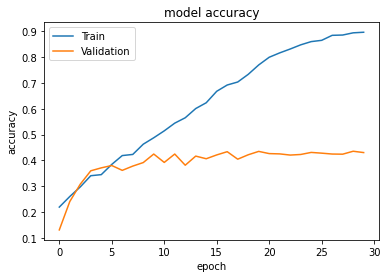

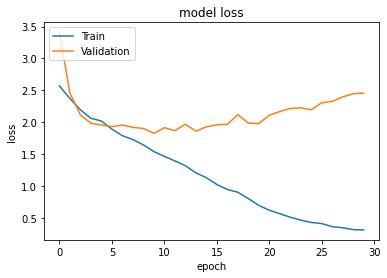

In [ ]:
# accuracy
plt.plot(history_cnn_3.history['accuracy'])
plt.plot(history_cnn_3.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
# loss
plt.plot(history_cnn_3.history['loss'])
plt.plot(history_cnn_3.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

Predicting image class using cnn

Corals (class 1)

In [ ]:
img_corals_name = 'corals_test.jpg'
path = '/content/corals_test.jpg'
img_corals = image.load_img(path, target_size=(80, 80))
x=image.img_to_array(img_corals)
x=np.expand_dims(x, axis=0)
imgs = np.vstack([x])

classes = model_3.predict(imgs, batch_size=8)
print(classes)

1/1 [==============================] - 0s 225ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]


Lobster (class 6)

In [ ]:
img_lobster_name = 'lobster_test.jpg'
path = '/content/lobster_test.jpg'
img_lobster = image.load_img(path, target_size=(80, 80))

x=image.img_to_array(img_lobster)
x=np.expand_dims(x, axis=0)
imgs = np.vstack([x])

classes = model_3.predict(imgs, batch_size=8)
print(classes)

1/1 [==============================] - 0s 18ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]


# CNN Data Augmentation

Specifying features of generated data

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
    rotation_range=45,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.2,
    horizontal_flip=True,
    fill_mode='reflect',
)

In [ ]:
datagen.fit(X_train)
datagen.fit(X_val)

Visualising data before data augmentation

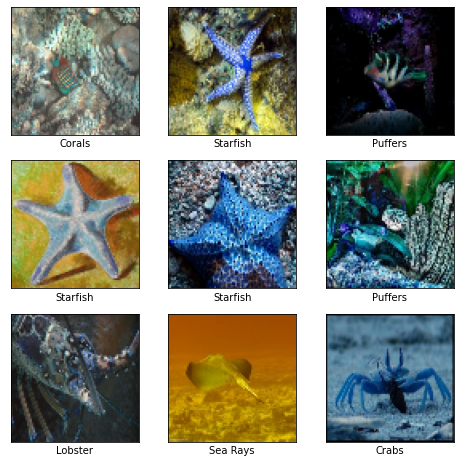

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 8))
for i in range(0, 9):  
      plt.subplot(330 + 1 + i)  
      plt.xticks([])
      plt.yticks([])
      plt.grid(False)
      plt.imshow(X_train[i].astype('uint8')) 
      plt.xlabel(class_names[y_train[i]])
plt.show()


Visualising data after augmentation

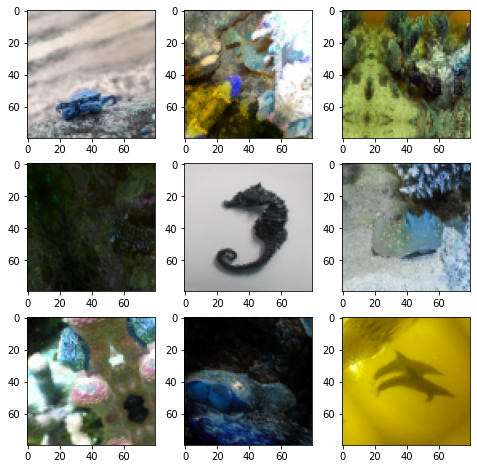

In [ ]:
plt.figure(figsize=(8, 8))
for X_batch, y_batch in datagen.flow(X_train, y_train, batch_size=9):
	for i in range(0, 9):
		plt.subplot(330 + 1 + i)
		plt.imshow(X_batch[i].astype('uint8'))
	plt.show()
	break

Visualising data after augmentation and standardising

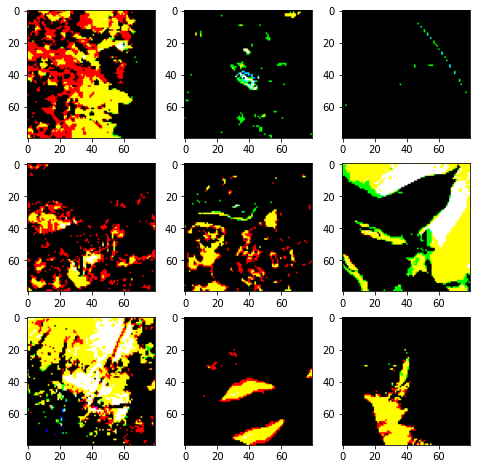

In [ ]:
plt.figure(figsize=(8, 8))
for X_batch, y_batch in datagen.flow(X_train, y_train, batch_size=9):
	for i in range(0, 9):
		plt.subplot(330 + 1 + i)
		plt.imshow(X_batch[i].astype('uint8'))
	plt.show()
	break

CNN Data Augmentation Architecture

In [ ]:
import tensorflow as tf
from tensorflow import keras

model_da = keras.models.Sequential([
    keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', input_shape=(80, 80, 3)),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu',padding='same'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(pool_size=2),
    keras.layers.Dropout(0.4),

    keras.layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(filters=64, kernel_size=3, activation='relu',  padding='same'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(pool_size=2),
    keras.layers.Dropout(0.4),

    keras.layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding='same'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding='same'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(pool_size=2),
    keras.layers.Dropout(0.4),

    keras.layers.Flatten(),
    keras.layers.Dense(units=128, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.4),
    keras.layers.Dense(16, activation='softmax'), 
])

In [ ]:
model_da.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 80, 80, 32)        896       
                                                                 
 batch_normalization_10 (Bat  (None, 80, 80, 32)       128       
 chNormalization)                                                
                                                                 
 conv2d_11 (Conv2D)          (None, 80, 80, 32)        9248      
                                                                 
 batch_normalization_11 (Bat  (None, 80, 80, 32)       128       
 chNormalization)                                                
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                      

Initialising Tensorboard

In [ ]:
from tensorflow import keras
import os 
root_log = os.path.join(os.curdir, 'my_logs')

def get_log():
  return os.path.join(root_log)
run_log = get_log()
tensorboard_cb = keras.callbacks.TensorBoard(run_log)

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.01)
optimizer.learning_rate.assign(0.0001)

model_da.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
history_da = model_da.fit(datagen.flow(X_train, y_train, batch_size=100),
         validation_data=datagen.flow(X_val, y_val,
         batch_size=25),
         steps_per_epoch=len(X_train) / 100, epochs=20, callbacks=[tensorboard_cb])


Epoch 1/30
52/52 [==============================] - 16s 255ms/step - loss: 3.2869 - accuracy: 0.1451 - val_loss: 3.0056 - val_accuracy: 0.0888
Epoch 2/30
52/52 [==============================] - 13s 242ms/step - loss: 2.8398 - accuracy: 0.2064 - val_loss: 3.2693 - val_accuracy: 0.0501
Epoch 3/30
52/52 [==============================] - 13s 256ms/step - loss: 2.6938 - accuracy: 0.2100 - val_loss: 3.6836 - val_accuracy: 0.0495
Epoch 4/30
52/52 [==============================] - 13s 247ms/step - loss: 2.5550 - accuracy: 0.2260 - val_loss: 3.5590 - val_accuracy: 0.0683
Epoch 5/30
52/52 [==============================] - 15s 288ms/step - loss: 2.4953 - accuracy: 0.2338 - val_loss: 3.2288 - val_accuracy: 0.0888
Epoch 6/30
52/52 [==============================] - 13s 244ms/step - loss: 2.4317 - accuracy: 0.2412 - val_loss: 2.9459 - val_accuracy: 0.1048
Epoch 7/30
52/52 [==============================] - 13s 242ms/step - loss: 2.3962 - accuracy: 0.2459 - val_loss: 2.7366 - val_accuracy: 0.1333

CNN data augmentation evaluation

In [ ]:
loss, accuracy = model_da.evaluate(X_test, y_test, verbose=1)
loss_v, accuracy_v = model_da.evaluate(X_val, y_val, verbose=1)
print("Validation: accuracy = %f  ;  loss_v = %f" % (accuracy_v, loss_v))
print("Test: accuracy = %f  ;  loss = %f" % (accuracy, loss))

55/55 [==============================] - 0s 8ms/step - loss: 2.2916 - accuracy: 0.2614
Validation: accuracy = 0.261390  ;  loss_v = 2.291589
Test: accuracy = 0.285877  ;  loss = 2.241533


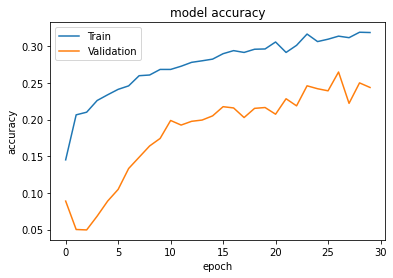

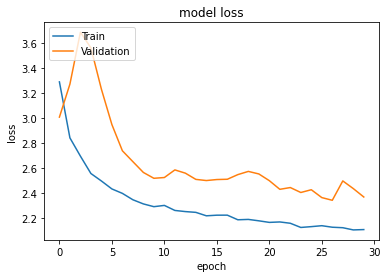

In [ ]:
# accuracy
plt.plot(history_da.history['accuracy'])
plt.plot(history_da.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
# loss
plt.plot(history_da.history['loss'])
plt.plot(history_da.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=./my_logs --port=6006

<IPython.core.display.Javascript object>